<a class="anchor" id="0"></a>

# Used Cars Price Prediction 

Deciding whether a used car is worth the posted price when you see listings online can be  difficult. Several factors, including odometer, manufacturer, model, year, etc. can influence the actual worth of a car. From the perspective of a seller, it is also a dilemma to price a used car appropriately.

Based on existing given features of used car, The aim is to use machine learning algorithms to develop models for predicting used car prices. The data for training and testing are collected from Kaggle.


## 1. Import libraries <a class="anchor" id="1"></a>


In [1]:
# computation
import numpy as np
import pandas as pd

# plots
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.inspection import plot_partial_dependence as ppd

# preprocessing
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split

# Run below line everytime you restart runtime because colab uses older version of following package by default
# !pip install -U pandas-profiling
import pandas_profiling as pp

# models
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import  GradientBoostingRegressor 
from sklearn.neural_network import MLPRegressor

# metrics
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# ignore warnings
import warnings
warnings.filterwarnings("ignore")

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## 2. Load datasets <a class="anchor" id="2"></a>


In [2]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
valid_part = 0.3
pd.set_option('max_columns',100)

In [4]:
train0 = pd.read_csv('/content/drive/My Drive/Colab Notebooks/car.csv')
train0.head(5)

,id,url,region,region_url,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,vin,drive,size,type,paint_color,image_url,description,county,state,lat,long
0,7088746062,https://greensboro.craigslist.org/ctd/d/cary-2...,greensboro,https://greensboro.craigslist.org,10299,2012.0,acura,tl,NaN,NaN,gas,90186.0,clean,automatic,19UUA8F22CA003926,NaN,NaN,other,blue,https://images.craigslist.org/01414_3LIXs9EO33...,2012 Acura TL Base 4dr Sedan Offered by: B...,NaN,nc,35.7636,-78.7443
1,7088745301,https://greensboro.craigslist.org/ctd/d/bmw-3-...,greensboro,https://greensboro.craigslist.org,0,2011.0,bmw,335,NaN,6 cylinders,gas,115120.0,clean,automatic,NaN,rwd,NaN,convertible,blue,https://images.craigslist.org/00S0S_1kTatLGLxB...,BMW 3 Series 335i Convertible Navigation Dakot...,NaN,nc,NaN,NaN
2,7088744126,https://greensboro.craigslist.org/cto/d/greens...,greensboro,https://greensboro.craigslist.org,9500,2011.0,jaguar,xf,excellent,NaN,gas,85000.0,clean,automatic,NaN,NaN,NaN,NaN,blue,https://images.craigslist.org/00505_f22HGItCRp...,2011 jaguar XF premium - estate sale. Retired ...,NaN,nc,36.1032,-79.8794
3,7088743681,https://greensboro.craigslist.org/ctd/d/cary-2...,greensboro,https://greensboro.craigslist.org,3995,2004.0,honda,element,NaN,NaN,gas,212526.0,clean,automatic,5J6YH18314L006498,fwd,NaN,SUV,orange,https://images.craigslist.org/00E0E_eAUnhFF86M...,2004 Honda Element LX 4dr SUV Offered by: ...,NaN,nc,35.7636,-78.7443
4,7074612539,https://lincoln.craigslist.org/ctd/d/gretna-20...,lincoln,https://lincoln.craigslist.org,41988,2016.0,chevrolet,silverado k2500hd,NaN,NaN,gas,NaN,clean,automatic,1GC1KWE85GF266427,NaN,NaN,NaN,NaN,https://images.craigslist.org/00S0S_8msT7RQquO...,"Shop Indoors, Heated Showroom!!!www.gretnaauto...",NaN,ne,41.1345,-96.2458


## 3. Pre-processing <a class="anchor" id="2"></a>

In [0]:
drop_columns = ['url','id', 'region', 'region_url', 'model', 'title_status', 'vin', 'size', 'image_url', 'description', 'lat','long', 'county']
train0 = train0.drop(columns = drop_columns)

In [0]:
train0=train0.head(1000000)

In [7]:
train0.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 539759 entries, 0 to 539758
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   price         539759 non-null  int64  
 1   year          538772 non-null  float64
 2   manufacturer  516175 non-null  object 
 3   condition     303707 non-null  object 
 4   cylinders     321264 non-null  object 
 5   fuel          536366 non-null  object 
 6   odometer      440783 non-null  float64
 7   transmission  535786 non-null  object 
 8   drive         383987 non-null  object 
 9   type          392290 non-null  object 
 10  paint_color   365520 non-null  object 
 11  state         539759 non-null  object 
dtypes: float64(2), int64(1), object(9)
memory usage: 49.4+ MB


In [0]:
train0.cylinders = train0.cylinders.astype(str)
train0["cylinders"] = train0["cylinders"].map(lambda x: x.rstrip(" cylinders"))
train0["cylinders"] = train0["cylinders"].map(lambda x: int(x) if x.isdecimal() else None)

In [9]:
train0 = train0.dropna()
train0.head(5)

,price,year,manufacturer,condition,cylinders,fuel,odometer,transmission,drive,type,paint_color,state
13,7995,2010.0,chevrolet,excellent,8.0,gas,194050.0,automatic,4wd,truck,white,co
25,4000,1995.0,dodge,excellent,8.0,gas,133000.0,automatic,4wd,truck,grey,ny
28,16000,2011.0,bmw,excellent,6.0,gas,85000.0,automatic,fwd,sedan,grey,nc
29,10950,2011.0,buick,excellent,6.0,gas,43418.0,automatic,fwd,sedan,red,ny
31,9400,2011.0,bmw,good,6.0,gas,145000.0,automatic,4wd,SUV,blue,ny


In [10]:
# Determination categorical features
numerics = {'int8', 'int16', 'int32', 'int64', 'float16', 'float32', 'float64'}
features = train0.columns
categorical_columns = filter(lambda x: str(train0[x].dtype) not in numerics, features)

for col in categorical_columns:
    le = LabelEncoder()
    le.fit(train0[col].astype(str).values)
    train0[col] = le.transform(train0[col].astype(str).values)
train0.head()

,price,year,manufacturer,condition,cylinders,fuel,odometer,transmission,drive,type,paint_color,state
13,7995,2010.0,7,0,8.0,2,194050.0,0,0,10,10,5
25,4000,1995.0,10,0,8.0,2,133000.0,0,0,10,5,34
28,16000,2011.0,4,0,6.0,2,85000.0,0,1,9,5,27
29,10950,2011.0,5,0,6.0,2,43418.0,0,1,9,8,34
31,9400,2011.0,4,2,6.0,2,145000.0,0,0,0,1,34


In [0]:
train0['year'] = (train0['year']-1900).astype(int)
train0['odometer'] = train0['odometer'].astype(int)

In [0]:
# Removing outliers
train0 = train0[train0['price'] > 1000]
train0 = train0[train0['price'] < 40000]
# Rounded ['odometer'] to 5000
train0['odometer'] = train0['odometer'] // 5000
train0 = train0[train0['year'] > 110]

In [13]:
train0.head(10)

,price,year,manufacturer,condition,cylinders,fuel,odometer,transmission,drive,type,paint_color,state
28,16000,111,4,0,6.0,2,17,0,1,9,5,27
29,10950,111,5,0,6.0,2,8,0,1,9,8,34
31,9400,111,4,2,6.0,2,29,0,0,0,1,34
35,4500,112,13,0,6.0,2,31,0,0,9,9,34
63,8599,115,10,2,4.0,2,7,0,1,9,10,27
66,27900,115,20,2,6.0,2,12,0,2,2,9,27
67,25500,114,13,2,6.0,2,17,0,0,8,10,27
83,7000,115,32,3,4.0,2,14,0,1,9,10,42
88,5500,113,18,3,4.0,2,22,0,1,9,8,45
100,14900,117,8,0,4.0,2,16,0,1,9,0,14


## 4. Analysing Data <a class="anchor" id="3"></a>


In [14]:
train0.corr()

,price,year,manufacturer,condition,cylinders,fuel,odometer,transmission,drive,type,paint_color,state
price,1.000000,0.453966,-0.013871,0.097321,0.535397,-0.218472,-0.200516,0.181131,-0.235984,0.067531,0.028314,-0.001973
year,0.453966,1.000000,0.039156,0.136914,-0.067020,0.070402,-0.296464,0.131559,-0.013376,0.012177,0.026639,-0.031838
manufacturer,-0.013871,0.039156,1.000000,-0.032195,-0.206389,-0.059355,-0.022546,0.022363,-0.108733,0.044904,-0.020099,0.002957
condition,0.097321,0.136914,-0.032195,1.000000,0.065203,0.062585,-0.064978,0.173855,0.060709,0.026090,0.012074,-0.031475
cylinders,0.535397,-0.067020,-0.206389,0.065203,1.000000,-0.103449,0.062481,0.093108,-0.116342,0.149532,0.085695,0.034459
fuel,-0.218472,0.070402,-0.059355,0.062585,-0.103449,1.000000,-0.077627,0.093930,0.059745,-0.123681,-0.022288,-0.032267
odometer,-0.200516,-0.296464,-0.022546,-0.064978,0.062481,-0.077627,1.000000,-0.111087,-0.040903,0.020540,0.026567,0.017020
transmission,0.181131,0.131559,0.022363,0.173855,0.093108,0.093930,-0.111087,1.000000,0.070795,-0.004901,-0.007432,-0.034229
drive,-0.235984,-0.013376,-0.108733,0.060709,-0.116342,0.059745,-0.040903,0.070795,1.000000,0.095083,0.047883,-0.080560
type,0.067531,0.012177,0.044904,0.026090,0.149532,-0.123681,0.020540,-0.004901,0.095083,1.000000,0.071658,0.002969


In [15]:
train0.describe()

,price,year,manufacturer,condition,cylinders,fuel,odometer,transmission,drive,type,paint_color,state
count,66288.000000,66288.000000,66288.000000,66288.000000,66288.000000,66288.000000,66288.000000,66288.000000,66288.000000,66288.000000,66288.000000,66288.000000
mean,16381.932703,114.167738,18.963100,1.127595,5.769687,1.919005,16.458741,0.185132,0.709676,6.274348,5.721775,24.122571
std,8522.674360,2.258927,11.730285,1.220626,1.600557,0.537155,19.279635,0.544767,0.742371,4.095513,4.082469,14.944412
min,1024.000000,111.000000,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,9499.000000,112.000000,10.000000,0.000000,4.000000,2.000000,8.000000,0.000000,0.000000,2.000000,1.000000,9.000000
50%,14988.000000,114.000000,14.000000,0.000000,6.000000,2.000000,16.000000,0.000000,1.000000,8.000000,8.000000,23.000000
75%,21995.000000,116.000000,32.000000,2.000000,8.000000,2.000000,22.000000,0.000000,1.000000,9.000000,10.000000,37.000000
max,39999.000000,121.000000,42.000000,5.000000,12.000000,4.000000,1737.000000,2.000000,2.000000,12.000000,11.000000,50.000000


In [16]:
train0.profile_report()

## 5. Preparing to modeling <a class="anchor" id="4"></a>

In [0]:
target_name = 'price'
train_target0 = train0[target_name]
train0 = train0.drop([target_name], axis=1)

In [0]:
# standardize data
scaler = StandardScaler()
train0 = pd.DataFrame(scaler.fit_transform(train0), columns = train0.columns)

In [19]:
train0.head(3)

,year,manufacturer,condition,cylinders,fuel,odometer,transmission,drive,type,paint_color,state
0,-1.402331,-1.275605,-0.923791,0.143897,0.150786,0.028074,-0.339839,0.391080,0.665527,-0.176800,0.192544
1,-1.402331,-1.190355,-0.923791,0.143897,0.150786,-0.438743,-0.339839,0.391080,0.665527,0.558055,0.660950
2,-1.402331,-1.275605,0.714725,0.143897,0.150786,0.650497,-0.339839,-0.955966,-1.532017,-1.156607,0.660950


In [20]:
train0.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66288 entries, 0 to 66287
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   year          66288 non-null  float64
 1   manufacturer  66288 non-null  float64
 2   condition     66288 non-null  float64
 3   cylinders     66288 non-null  float64
 4   fuel          66288 non-null  float64
 5   odometer      66288 non-null  float64
 6   transmission  66288 non-null  float64
 7   drive         66288 non-null  float64
 8   type          66288 non-null  float64
 9   paint_color   66288 non-null  float64
 10  state         66288 non-null  float64
dtypes: float64(11)
memory usage: 5.6 MB


In [0]:
# split data for training and testing 
train, test, target, target_test = train_test_split(train0, train_target0, test_size=valid_part, random_state=0)

In [22]:
train.head(3)

,year,manufacturer,condition,cylinders,fuel,odometer,transmission,drive,type,paint_color,state
62170,0.368435,-1.360855,-0.923791,-1.105678,0.150786,-0.438743,-0.339839,0.391080,0.665527,1.047958,0.594034
65239,-0.516948,-0.423105,1.533983,1.393471,0.150786,0.287417,-0.339839,-0.955966,0.909698,-1.401558,-1.011929
48730,0.368435,-0.508355,-0.923791,0.143897,0.150786,-0.127531,-0.339839,-0.955966,0.909698,0.558055,0.125628


In [23]:
test.head(3)

,year,manufacturer,condition,cylinders,fuel,odometer,transmission,drive,type,paint_color,state
60639,-1.402331,-1.019855,0.714725,-1.105678,0.150786,1.428526,-0.339839,1.738126,-1.532017,-1.156607,-0.610438
2343,-1.402331,-1.019855,-0.104533,1.393471,0.150786,1.895344,-0.339839,-0.955966,0.909698,0.803007,1.597762
203,0.368435,-0.508355,0.714725,0.143897,0.150786,-0.127531,3.331483,-0.955966,0.421355,1.047958,0.192544


In [24]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 46401 entries, 62170 to 43567
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   year          46401 non-null  float64
 1   manufacturer  46401 non-null  float64
 2   condition     46401 non-null  float64
 3   cylinders     46401 non-null  float64
 4   fuel          46401 non-null  float64
 5   odometer      46401 non-null  float64
 6   transmission  46401 non-null  float64
 7   drive         46401 non-null  float64
 8   type          46401 non-null  float64
 9   paint_color   46401 non-null  float64
 10  state         46401 non-null  float64
dtypes: float64(11)
memory usage: 4.2 MB


In [25]:
test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19887 entries, 60639 to 37899
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   year          19887 non-null  float64
 1   manufacturer  19887 non-null  float64
 2   condition     19887 non-null  float64
 3   cylinders     19887 non-null  float64
 4   fuel          19887 non-null  float64
 5   odometer      19887 non-null  float64
 6   transmission  19887 non-null  float64
 7   drive         19887 non-null  float64
 8   type          19887 non-null  float64
 9   paint_color   19887 non-null  float64
 10  state         19887 non-null  float64
dtypes: float64(11)
memory usage: 1.8 MB


In [0]:
model_metrics = pd.DataFrame(columns=["Model", "R2_train", "R2_test", "Relative_error_train", "Relative_error_test", "RMSE_train", "RMSE_test"])

In [0]:
def relative_error(y_meas, y_pred):
    # Relative error between predicted y_pred and measured y_meas values
    return mean_absolute_error(y_meas, y_pred)*len(y_meas)/sum(abs(y_meas))

def rmse_error(y_meas, y_pred):
    # RMSE between predicted y_pred and measured y_meas values
    return (mean_squared_error(y_meas, y_pred))**0.5

In [0]:
def model_accuracy(model_name, model, train, test):
    # Calculation of accuracy of model акщь Sklearn by different metrics   

    global model_metrics
    
    model_metric = {}
    model_metric["Model"] = model_name

    ytrain = model.predict(train)  
    ytest = model.predict(test)

    print("="*5, "Metrics for training", "="*5)
    print()

    print('target = ', target[:5].values)
    print('ytrain = ', ytrain[:5].astype(int))

    acc_train_r2_num = round(r2_score(target, ytrain) * 100, 2)
    print('R2 score for train =', acc_train_r2_num)   
    model_metric["R2_train"] = acc_train_r2_num

    acc_train_d_num = round(relative_error(target, ytrain) * 100, 2)
    print('Relative error for train =', acc_train_d_num)   
    model_metric["Relative_error_train"] = acc_train_d_num

    acc_train_rmse_num = round(rmse_error(target, ytrain) * 100, 2)
    print('RMSE for train =', acc_train_rmse_num)   
    model_metric["RMSE_train"] = acc_train_rmse_num

    print()
    print("="*5, "Metrics for testing", "="*6)
    print()

    print('target_test =', target_test[:5].values)
    print('ytest =', ytest[:5].astype(int))
    
    acc_test_r2_num = round(r2_score(target_test, ytest) * 100, 2)
    print('R2_score for test =', acc_test_r2_num)
    model_metric["R2_test"] = acc_test_r2_num
    
    acc_test_d_num = round(relative_error(target_test, ytest) * 100, 2)
    print('Relative error for test =', acc_test_d_num)
    model_metric["Relative_error_test"] = acc_test_d_num
    
    acc_test_rmse_num = round(rmse_error(target_test, ytest) * 100, 2)
    print('RMSE for test =', acc_test_rmse_num)
    model_metric["RMSE_test"] = acc_test_rmse_num

    print()
    print("="*32)

    model_metrics = model_metrics.append(model_metric, ignore_index=True)

In [0]:
def plot_model(model):
    predicted = model.predict(test)
    residual = target_test - predicted
    fig = plt.figure(figsize=(30,30))
    ax1 = plt.subplot(211)
    sns.distplot(residual, color ='teal')
    plt.tick_params(axis='both', which='major', labelsize=20)
    plt.title('Residual counts',fontsize=35)
    plt.xlabel('Residual',fontsize=25)
    plt.ylabel('Count',fontsize=25)

    ax2 = plt.subplot(212)
    plt.scatter(predicted, residual, color ='teal')
    plt.tick_params(axis='both', which='major', labelsize=20)
    plt.xlabel('Predicted',fontsize=25)
    plt.ylabel('Residual',fontsize=25)
    plt.axhline(y=0)
    plt.title('Residual vs. Predicted',fontsize=35)

    plt.show()

## 6. Tuning models and test for all features <a class="anchor" id="5"></a>




Now we are ready to train any model and predict the required solution. we are going to use These models:

- Linear Regression
- Gradient Boosting Regressor
- MLP Regressor (Deep Learning)


### 6.1 Linear Regression <a class="anchor" id="5.1"></a>


In [30]:
# Linear Regression
linreg = LinearRegression()
linreg.fit(train, target)
model_accuracy("Linear Regression", linreg, train, test)

===== Metrics for training =====

target =  [14900 21995 25995  8995 14995]
ytrain =  [10967 21393 18775  6827 19443]
R2 score for train = 60.79
Relative error for train = 24.58
RMSE for train = 532896.01

===== Metrics for testing ======

target_test = [ 4500  6500 21900  7995  5200]
ytest = [ 2198 15538 21552  6722 10270]
R2_score for test = 62.57
Relative error for test = 24.13
RMSE for test = 523142.36



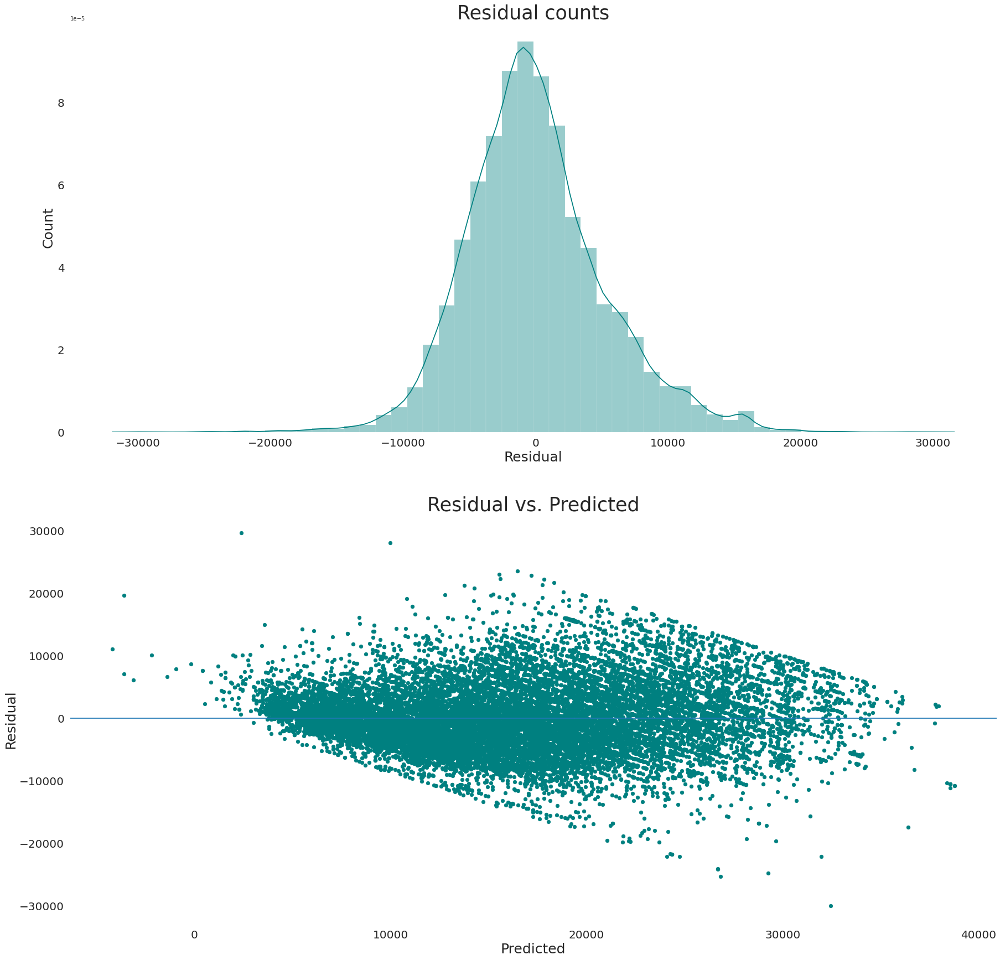

In [31]:
plot_model(linreg)

 ### 6.2 GradientBoost Regressor <a class="anchor" id="5.2"></a>



In [32]:
# Gradient Boosting Regression
params = {'max_depth': 9,
          'max_features': 'log2',
          'min_samples_leaf': 36,
          'min_samples_split': 35,
          'n_estimators': 755}

gradient_boosting = GradientBoostingRegressor(**params)
gradient_boosting.fit(train, target)
model_accuracy("Gradient Boosting Regressor",
               gradient_boosting, train, test)

===== Metrics for training =====

target =  [14900 21995 25995  8995 14995]
ytrain =  [15892 19060 26781  7856 10515]
R2 score for train = 92.25
Relative error for train = 9.97
RMSE for train = 236873.38

===== Metrics for testing ======

target_test = [ 4500  6500 21900  7995  5200]
ytest = [ 3183  5458 24230  7077  6972]
R2_score for test = 86.92
Relative error for test = 12.71
RMSE for test = 309225.31



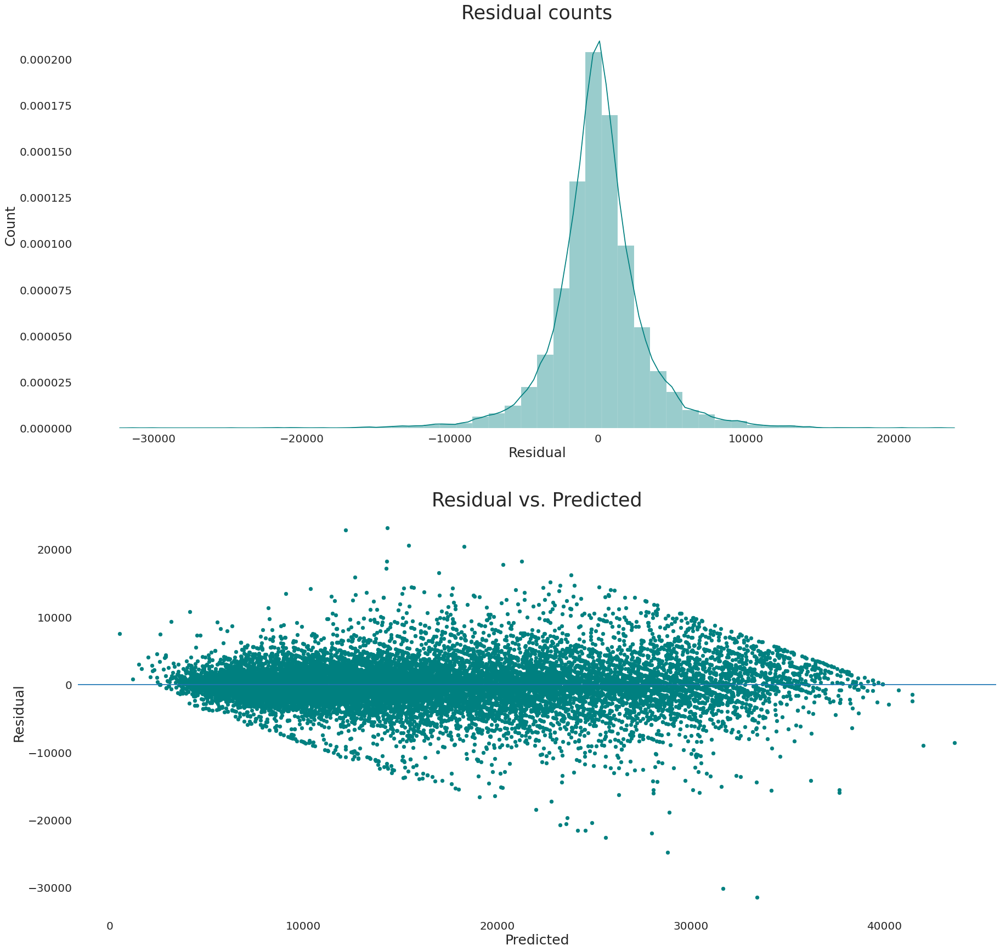

In [33]:
plot_model(gradient_boosting)

### 6.3 MLPRegressor <a class="anchor" id="5.3"></a>


In [34]:
# MLPRegressor
params = {
    'hidden_layer_sizes': (50, 50, 50, 50),
    'activation': 'relu',
    'solver': 'adam',
    'learning_rate': 'constant',
    'learning_rate_init': 0.01,
    'alpha': 0.0001,
    'max_iter': 10000,
    'early_stopping': True,
    'warm_start': False
}
mlp = MLPRegressor(**params)
mlp.fit(train, target)
model_accuracy("MLP Regressor", mlp, train, test)


===== Metrics for training =====

target =  [14900 21995 25995  8995 14995]
ytrain =  [12510 20551 24450  9081 11177]
R2 score for train = 80.79
Relative error for train = 16.28
RMSE for train = 372953.38

===== Metrics for testing ======

target_test = [ 4500  6500 21900  7995  5200]
ytest = [ 4053  9088 25287  7030  8020]
R2_score for test = 80.16
Relative error for test = 16.46
RMSE for test = 380871.32



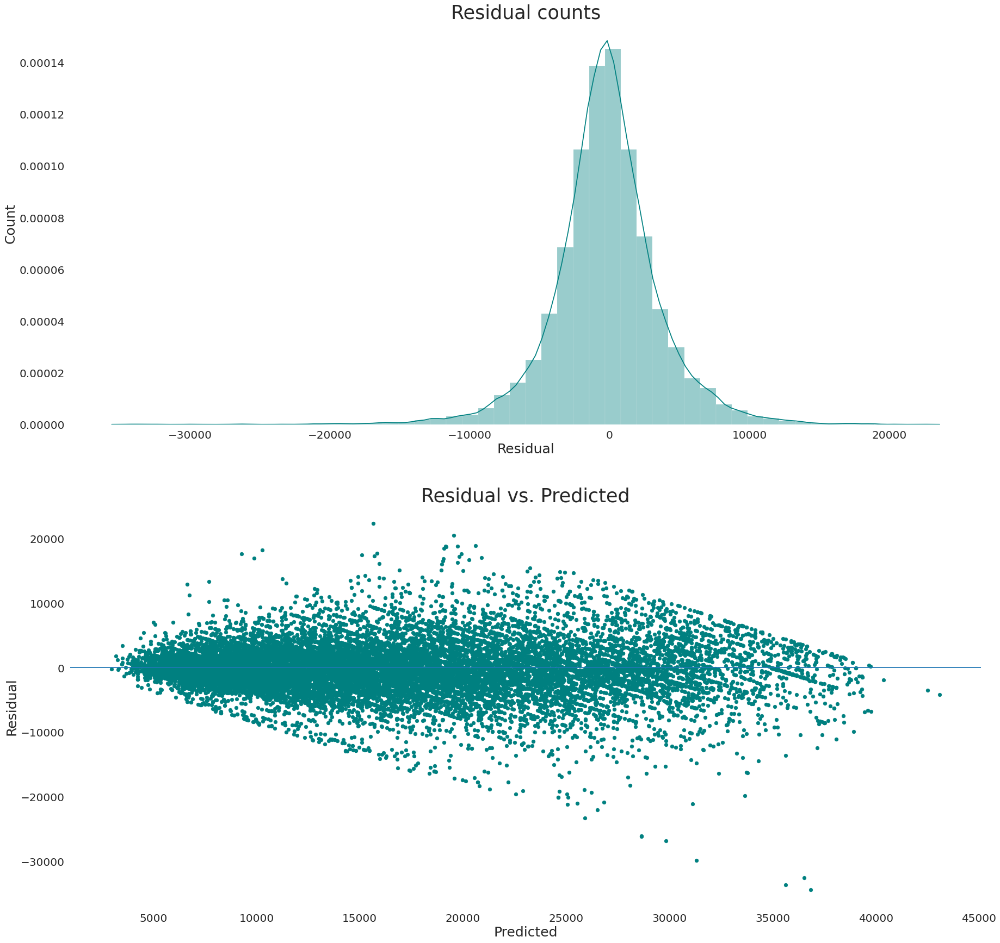

In [35]:
plot_model(mlp)

 ## 7 Models comparison <a class="anchor" id="6"></a>


We can now compare our models and find out which is the best one for our problem.

In [36]:
pd.options.display.float_format = '{:,.2f}'.format
print('Prediction accuracy metrics for models: ')
model_metrics.sort_values(by=['R2_test', 'R2_train'], ascending=False)

Prediction accuracy metrics for models: 


,Model,R2_train,R2_test,Relative_error_train,Relative_error_test,RMSE_train,RMSE_test
1,Gradient Boosting Regressor,92.25,86.92,9.97,12.71,"236,873.38","309,225.31"
2,MLP Regressor,80.79,80.16,16.28,16.46,"372,953.38","380,871.32"
0,Linear Regression,60.79,62.57,24.58,24.13,"532,896.01","523,142.36"


 ## 8 Analyzing Feature Importance <a class="anchor" id="6"></a>



In [37]:
pd.options.display.float_format = '{:.4f}'.format
pd.DataFrame(gradient_boosting.feature_importances_, index=train.columns)

,0
year,0.1967
manufacturer,0.0649
condition,0.0119
cylinders,0.2407
fuel,0.0699
odometer,0.1626
transmission,0.0202
drive,0.1361
type,0.0587
paint_color,0.0156


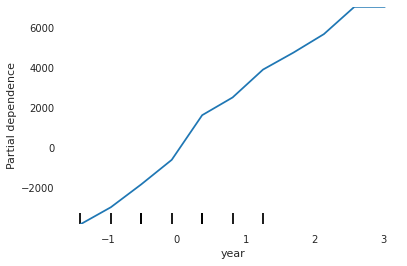

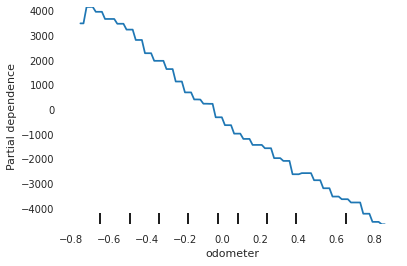

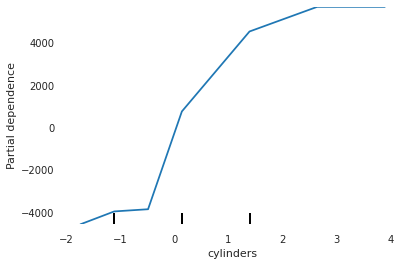

In [39]:
for feature in ["year", "odometer", "cylinders"]:
    ppd(gradient_boosting, train, [feature])
